In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import read_json_log, scatterdots, scatterjitter, clean_experiment_logs, METRICS, \
    check_omitted_parameters, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS

from bokeh.io import show, output_notebook
from bokeh.plotting import figure
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
from bokeh.transform import jitter
output_notebook()

Loading BokehJS ...

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

### read experiment logs and preprocess metrics

In [4]:
files = glob.glob('./experiments/wide-auc.log')
df = pd.concat([read_json_log(f) for f in files], ignore_index=True)
df = clean_experiment_logs(df)

### dependencies between classification metrics on validation dataset

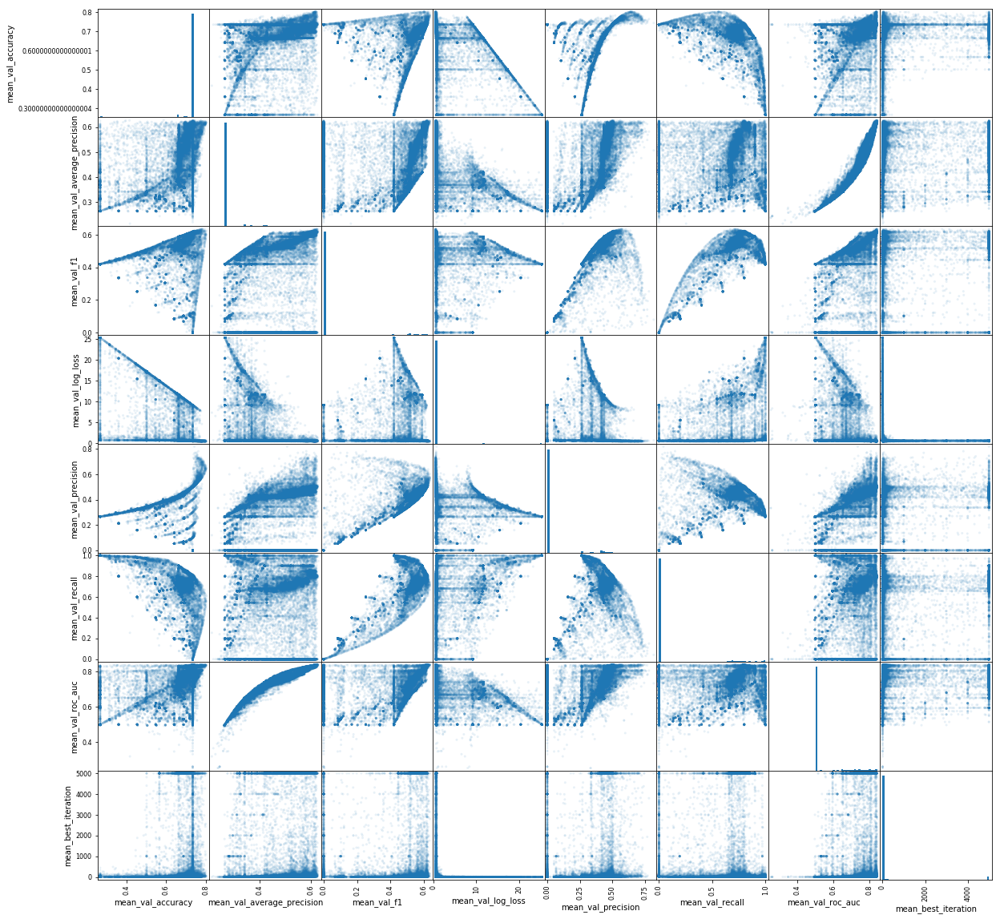

In [5]:
pd.plotting.scatter_matrix(
    df[['mean_val_' + m for m in METRICS] + ['mean_best_iteration']], 
    alpha=0.1, figsize=(20, 20), hist_kwds={'bins': 50});

### check how parameters affect roc_auc

bigger bagging_fraction is better (need to check overfit later)

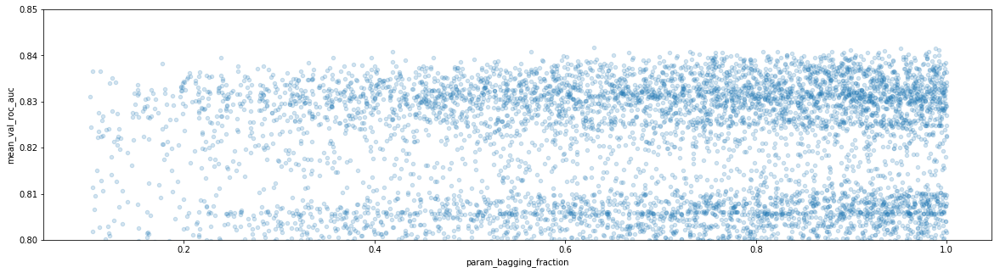

In [25]:
df.plot(x='param_bagging_fraction', y='mean_val_roc_auc', kind='scatter', alpha=0.2, ylim=(0.8, 0.85));

15 iterations is enough to reach good roc_auc

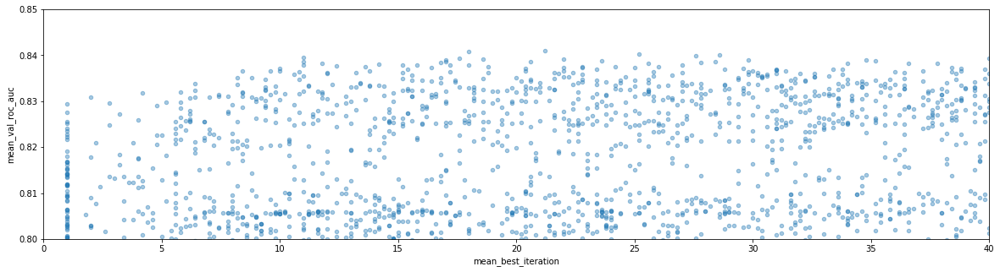

In [26]:
df.plot(x='mean_best_iteration', y='mean_val_roc_auc', kind='scatter', alpha=0.4, ylim=(0.8, 0.85), xlim=(0, 40));

setting learning_rate too small decreases roc_auc (remember that max_iteration was capped at 2000)

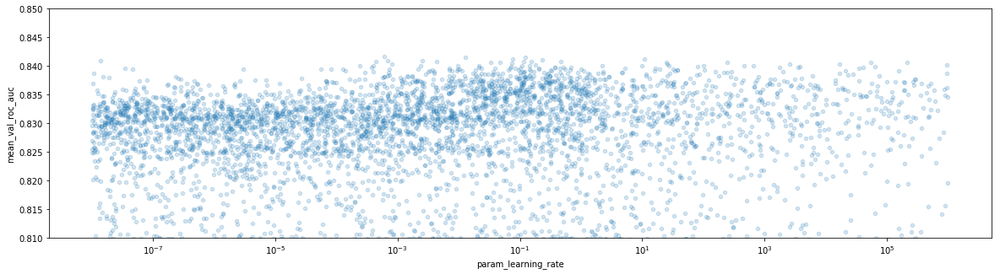

In [24]:
df.plot(x='param_learning_rate', y='mean_val_roc_auc', kind='scatter', alpha=0.2, ylim=(0.81, 0.85), logx=True);

TODO: max_delta_step

don't set lambda_l1 too large

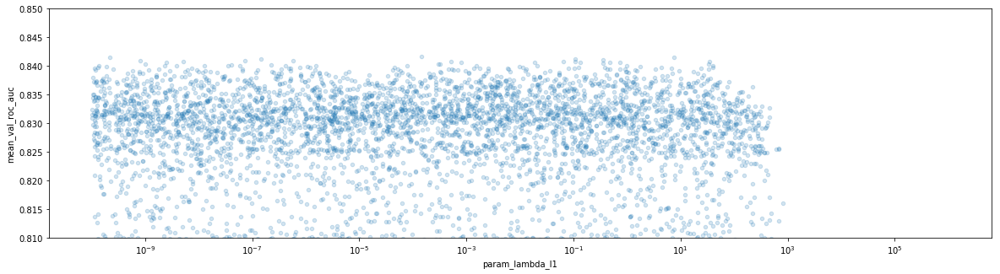

In [27]:
df.plot(x='param_lambda_l1', y='mean_val_roc_auc', kind='scatter', alpha=0.2, 
        ylim=(0.81, 0.85), logx=True);

same for min_gain_to_split

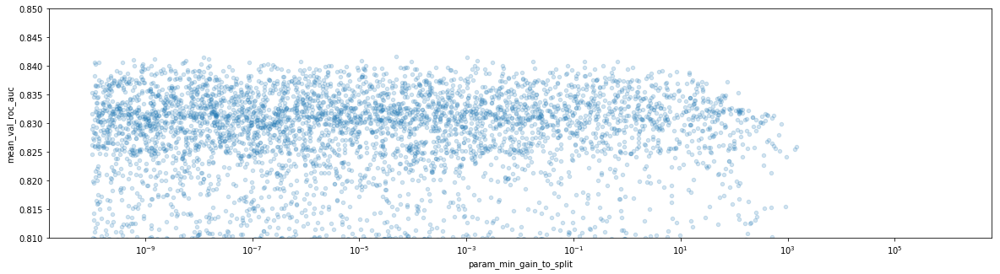

In [28]:
df.plot(x='param_min_gain_to_split', y='mean_val_roc_auc', kind='scatter', alpha=0.2, 
        ylim=(0.81, 0.85), logx=True);

increasing min_data_in_leaf slightly decreases roc_auc

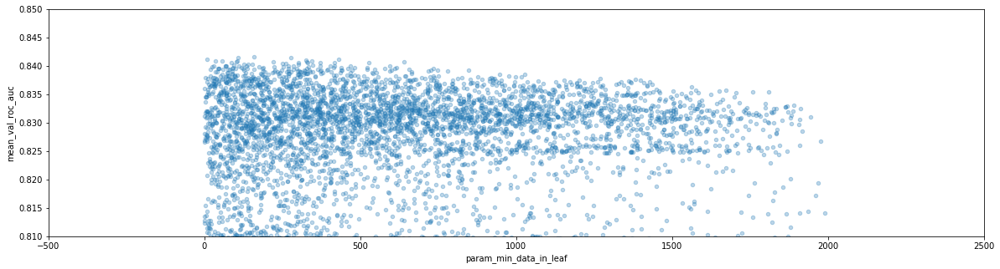

In [32]:
df.plot(x='param_min_data_in_leaf', y='mean_val_roc_auc', kind='scatter', alpha=0.3, 
        ylim=(0.81, 0.85), xlim=(-500, 2500));

there is someone hiding in scale_pos_weight plot

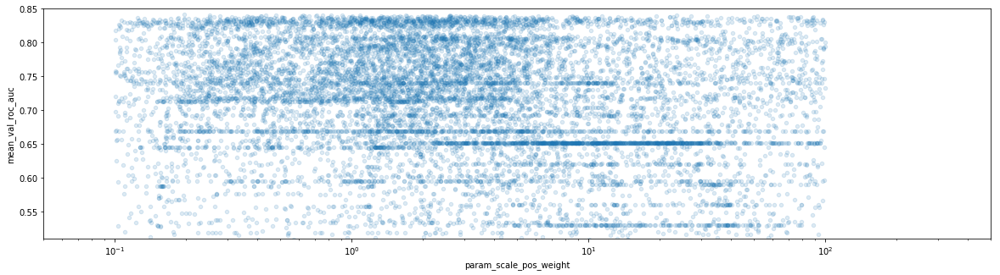

In [33]:
df.plot(x='param_scale_pos_weight', y='mean_val_roc_auc', kind='scatter', alpha=0.15, 
        logx=True, xlim=(0.05, 500),
        ylim=(0.51, 0.85));

### select best (by roc_auc) subset of experiments

In [13]:
df.mean_val_roc_auc.describe()

count    188983.000000
mean          0.534563
std           0.086698
min           0.252236
25%           0.500000
50%           0.500000
75%           0.500000
max           0.841688
Name: mean_val_roc_auc, dtype: float64

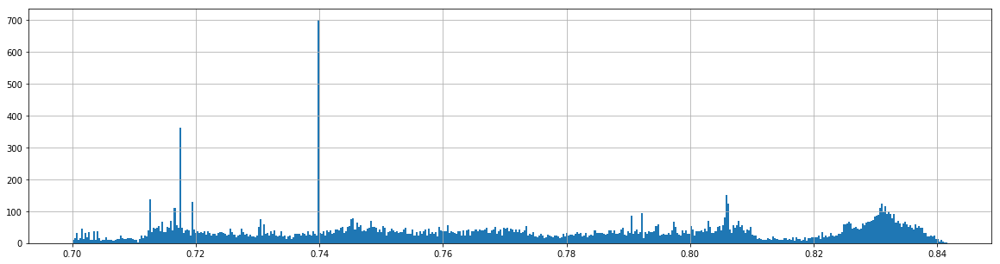

In [36]:
df.mean_val_roc_auc[df.mean_val_roc_auc > 0.7].hist(bins=500);

In [14]:
best_samples = df.sort_values('mean_val_roc_auc')[-5000:]

In [15]:
best_samples.describe()

,param_bagging_fraction,param_bagging_freq,param_bin_construct_sample_cnt,param_cat_l2,param_cat_smooth,param_feature_fraction,param_lambda_l1,param_lambda_l2,param_learning_rate,param_max_bin,param_max_cat_threshold,param_max_cat_to_onehot,param_max_delta_step,param_max_depth,param_min_data_in_bin,param_min_data_in_leaf,param_min_data_per_group,param_min_gain_to_split,param_min_sum_hessian_in_leaf,param_num_leaves,param_num_threads,param_scale_pos_weight,param_seed,param_verbosity,success,mean_train_accuracy,range_train_accuracy,mean_train_average_precision,range_train_average_precision,mean_train_f1,range_train_f1,mean_train_log_loss,range_train_log_loss,mean_train_precision,range_train_precision,mean_train_recall,range_train_recall,mean_train_roc_auc,range_train_roc_auc,mean_test_accuracy,range_test_accuracy,mean_test_average_precision,range_test_average_precision,mean_test_f1,range_test_f1,mean_test_log_loss,range_test_log_loss,mean_test_precision,range_test_precision,mean_test_recall,range_test_recall,mean_test_roc_auc,range_test_roc_auc,mean_val_accuracy,range_val_accuracy,mean_val_average_precision,range_val_average_precision,mean_val_f1,range_val_f1,mean_val_log_loss,range_val_log_loss,mean_val_precision,range_val_precision,mean_val_recall,range_val_recall,mean_val_roc_auc,range_val_roc_auc,test_overfit_accuracy,val_test_diff_accuracy,test_overfit_average_precision,val_test_diff_average_precision,test_overfit_f1,val_test_diff_f1,test_overfit_log_loss,val_test_diff_log_loss,test_overfit_precision,val_test_diff_precision,test_overfit_recall,val_test_diff_recall,test_overfit_roc_auc,val_test_diff_roc_auc,mean_train_time,mean_pred_time,mean_best_iteration,range_best_iteration
count,5000.000000,5000.000000,5000.000000,5.000000e+03,5.000000e+03,5000.000000,5.000000e+03,5.000000e+03,5.000000e+03,5000.000000,5000.00000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5.000000e+03,5000.000000,5000.0,1798.000000,5000.0000,5000.0,5000.0,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,0.694280,999.873400,5050.966000,2.325718e+08,2.041977e+08,0.583208,1.125415e+01,1.032031e+08,7.295030e+03,1013.556000,988.72040,51.239400,4.451632e+04,198.917200,2504.697600,623.722200,2006.979400,7.035688e+00,1.197904e+01,1992.691400,1.0,6.780732,49693.2136,-1.0,1.0,0.706747,0.014829,0.568132,0.017184,0.424856,0.028187,0.628092,1.563983e-02,0.350778,0.032987,0.577878,0.046571,0.815437,0.009224,0.705525,0.023297,0.564712,0.037729,0.422808,0.043357,0.629902,1.852831e-02,0.348935,0.042483,0.575308,0.073418,0.813217,0.028071,0.711413,0.014669,0.591387,0.015757,0.429106,0.027176,0.624028,0.015389,0.357181,0.034296,0.580614,0.044313,0.825529,0.006065,1.222017e-03,-0.005888,0.003420,-0.026675,0.002048,-0.006298,-1.810275e-03,5.874976e-03,0.001843,-0.008246,2.570000e-03,-0.005305,0.002221,-0.012312,1.923683,0.256007,1631.34524,135.586200
std,0.221666,585.145819,2901.799118,1.105668e+09,9.796740e+08,0.219926,5.390363e+01,6.770611e+08,5.738225e+04,583.057185,578.28535,28.184523,1.420645e+05,115.433637,1435.161932,463.386099,1153.758642,5.816371e+01,5.399896e+01,1162.960493,0.0,14.936959,29012.0888,0.0,0.0,0.068650,0.024907,0.025891,0.015474,0.257096,0.094576,0.344668,5.938006e-02,0.213946,0.105066,0.363158,0.120510,0.009113,0.006373,0.068408,0.026100,0.0

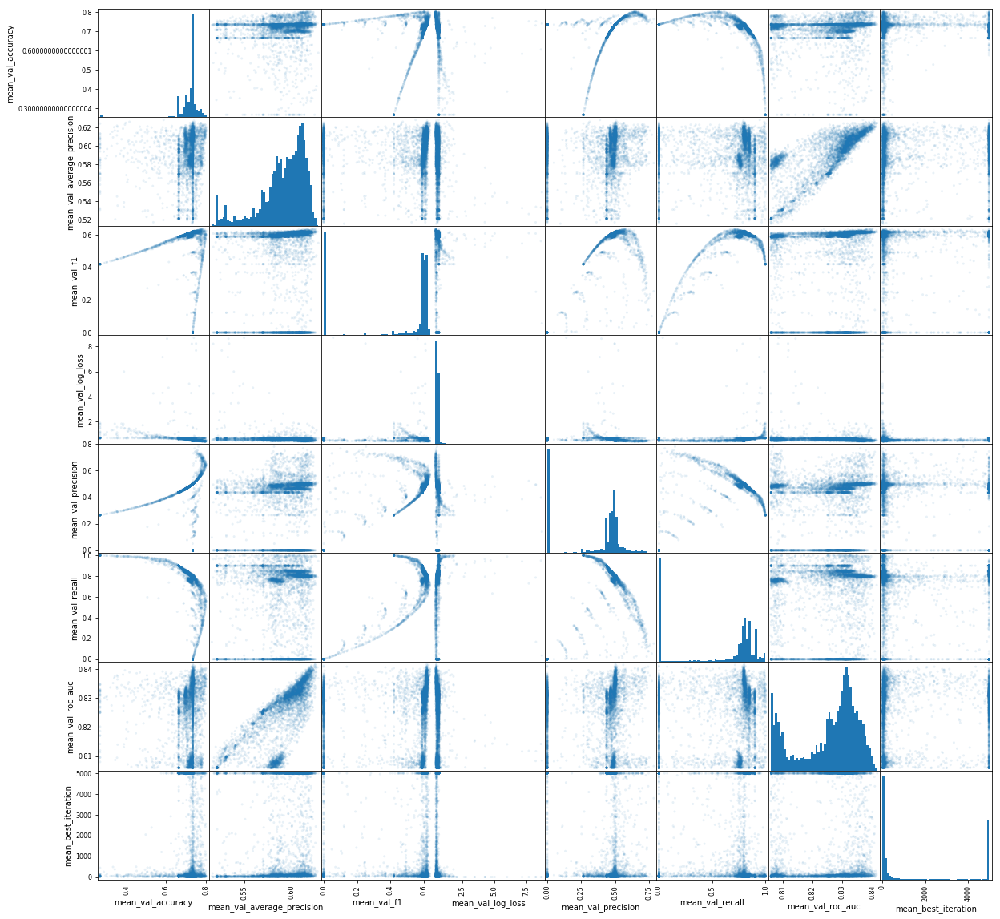

In [16]:
pd.plotting.scatter_matrix(
    best_samples[['mean_val_' + m for m in METRICS] + ['mean_best_iteration']], 
    alpha=0.1, figsize=(20, 20), hist_kwds={'bins': 50});

In [17]:
best_samples.groupby(SET_PARAMETERS).mean_val_roc_auc.describe() # TODO not that clear on wider range

count      mean  \
param_is_unbalance param_boost_from_average param_metric                       
False              False                    auc              464.0  0.824919   
                                            binary_logloss   332.0  0.826829   
                   True                     auc              480.0  0.824835   
                                            binary_logloss   522.0  0.825654   
True               False                    auc             1039.0  0.825087   
                                            binary_logloss  1144.0  0.826739   
                   True                     auc              496.0  0.825209   
                                            binary_logloss   523.0  0.824291   

                                                                 std  \
param_is_unbalance param_boost_from_average param_metric               
False              False                    auc             0.009920   
                                            binary_logloss  0.009460   
                   True                     auc             0.009654   
                                            binary_logloss  0.009872   
True               False                    auc             0.009495   
                                            binary_logloss  0.009894   
                   True                     auc             0.010849   
                                            binary_logloss  0.010219   

                                                                 min  \
param_is_unbalance param_boost_from_average param_metric               
False              False                    auc             0.805882   
                                            binary_logloss  0.806031   
                   True                     auc             0.805882   
                                            binary_logloss  0.805901   
True               False                    auc             0.805882   
                                            binary_logloss  0.805888   
                   True                     auc             0.805883   
                                            binary_logloss  0.805895   

                                                                 25%  \
param_is_unbalance param_boost_from_average param_metric               
False              False                    auc             0.817401   
                                            binary_logloss  0.822646   
                   True                     auc             0.818230   
                                            binary_logloss  0.819223   
True               False                    auc             0.819710   
                                            binary_logloss  0.822535   
                   True                     auc             0.814933   
                                            binary_logloss  0.815155   

                                                                 50%  \
param_is_unbalance param_boost_from_average param_metric               
False              False                    auc             0.827967   
                                            binary_logloss  0.830158   
                   True                     auc             0.827277   
                                            binary_logloss  0.829131   
True               False                    auc             0.828194   
                                            binary_logloss  0.830434   
                   True                     auc             0.828955   
                                            binary_logloss  0.827243   

                                                                 75%       max  
param_is_unbalance param_boost_from_average param_metric                        
False              False                    auc             0.832447  0.841225  
                                            binary_logloss  0.833448  0.840809  
                   True                     auc     

In [18]:
best_samples = best_samples[best_samples.param_is_unbalance & ~best_samples.param_boost_from_average]

subsetting by `is_unbalance & ~boost_from_average` (invert defaults) makes metric relation more sane-looking

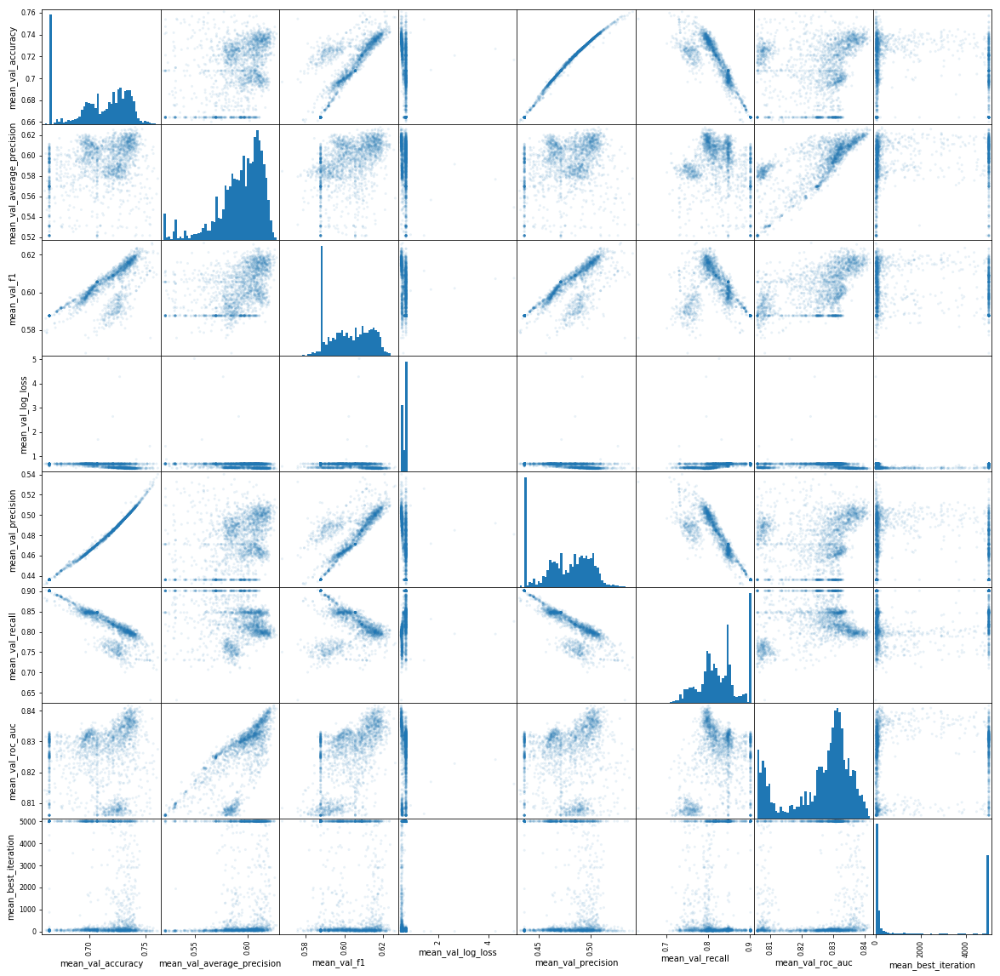

In [19]:
pd.plotting.scatter_matrix(
    best_samples[['mean_val_' + m for m in METRICS] + ['mean_best_iteration']], 
    alpha=0.1, figsize=(20, 20), hist_kwds={'bins': 50});

### dependencies between parameters on best subset

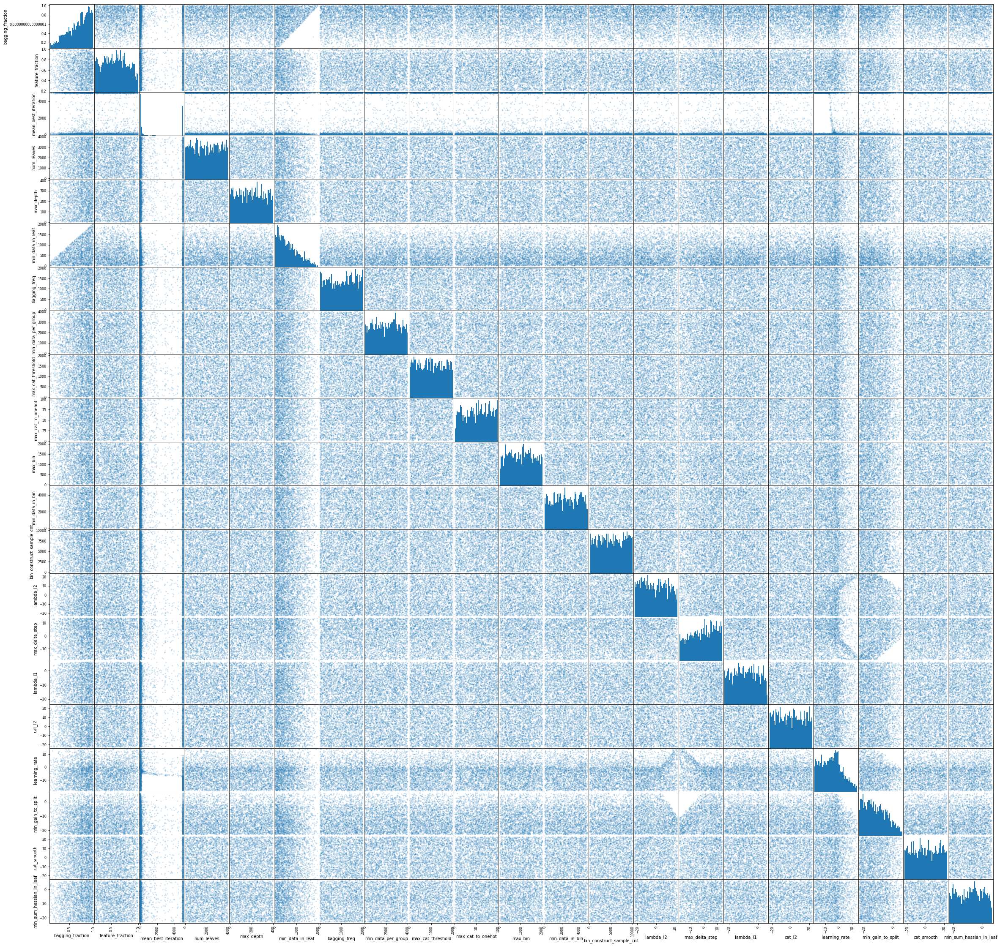

In [20]:
pd.plotting.scatter_matrix(
    pd.concat([best_samples[CONT_PARAMETERS + INT_PARAMETERS], np.log(best_samples[list(set(LOG_PARAMETERS) - set(['param_scale_pos_weight']))])],
              axis='columns').rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.2, figsize=(40, 40), hist_kwds={'bins': 50});